this notebook will train yolo detection model to identify logo in national IDs, then removes this logo from the image

In [ ]:
!pip install ultralytics
!pip install -U albumentations
!pip install opencv-python
!pip install numpy
!pip install -U matplotlib

## Importing Packages and Modules

In [1]:
from helpers import * # This module contains user-defined functions to facilitate upcoming tasks

## Visualizing Original Images

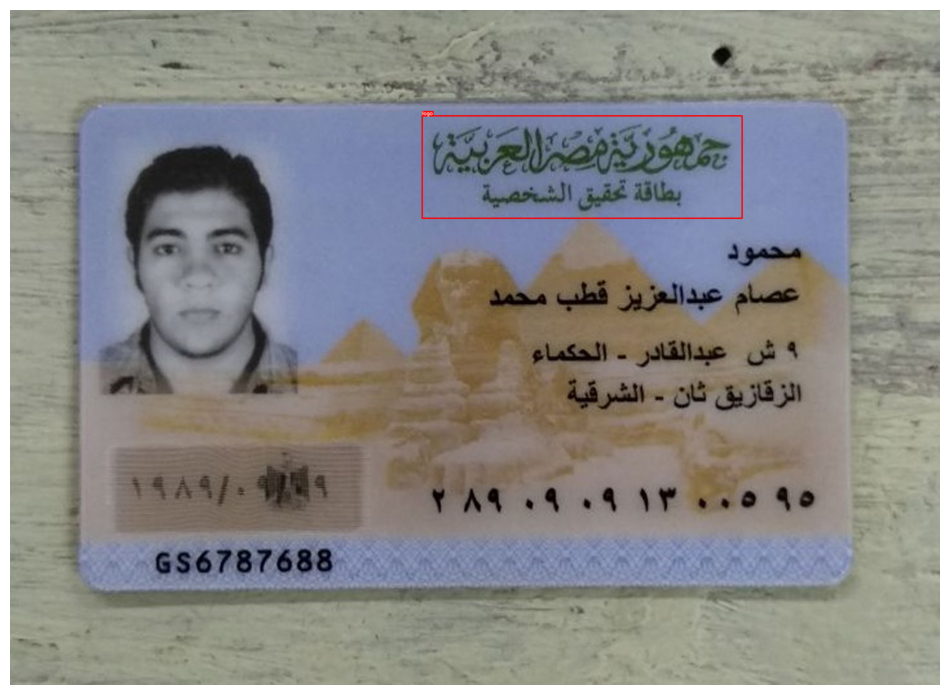

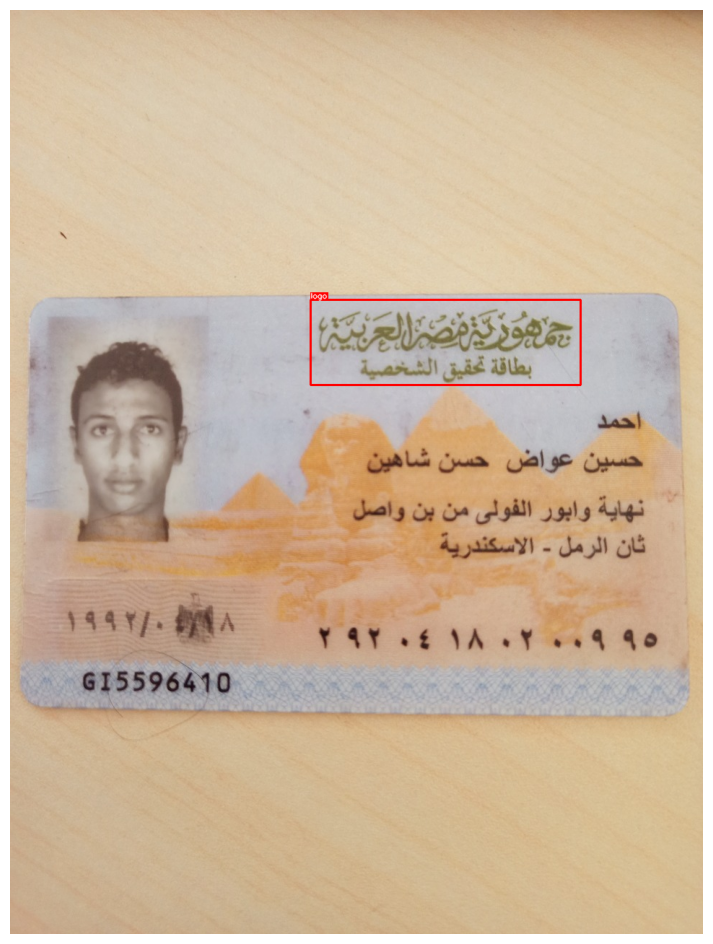

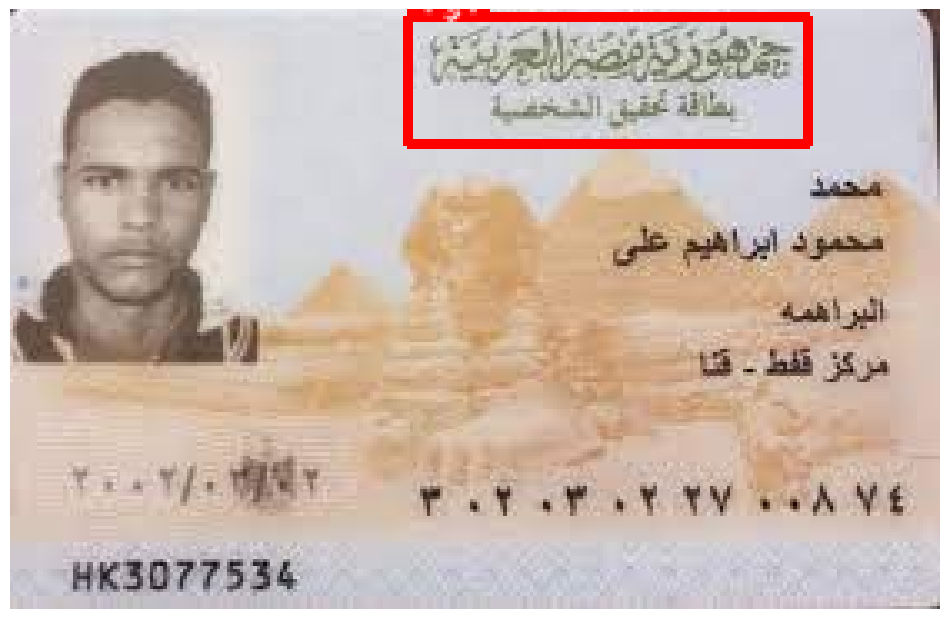

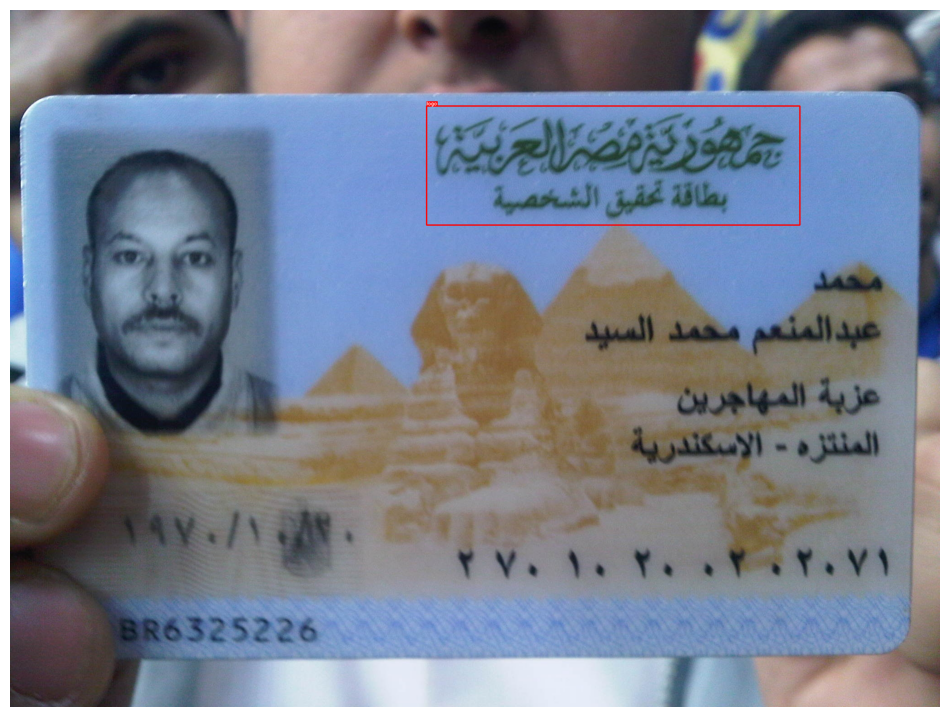

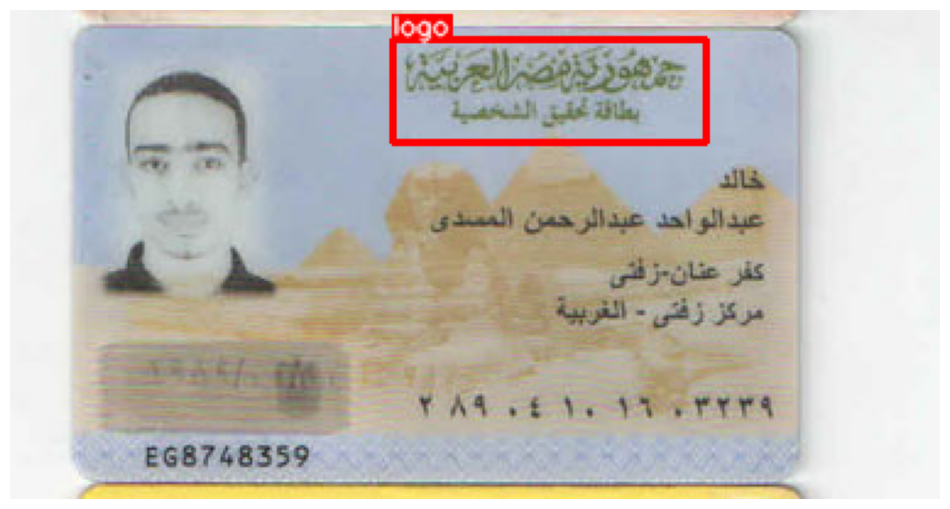

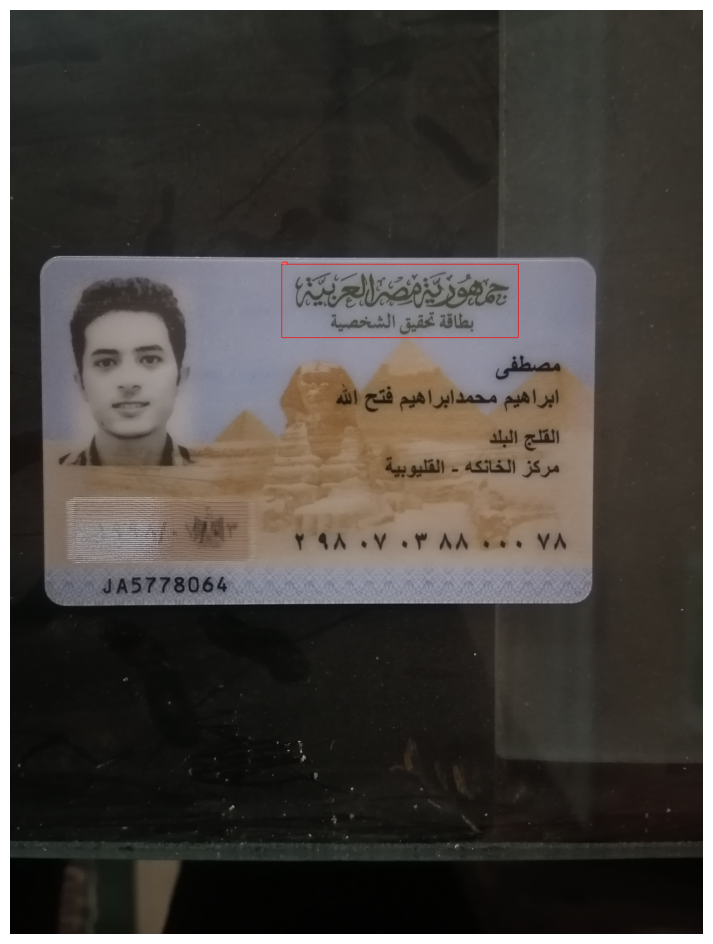

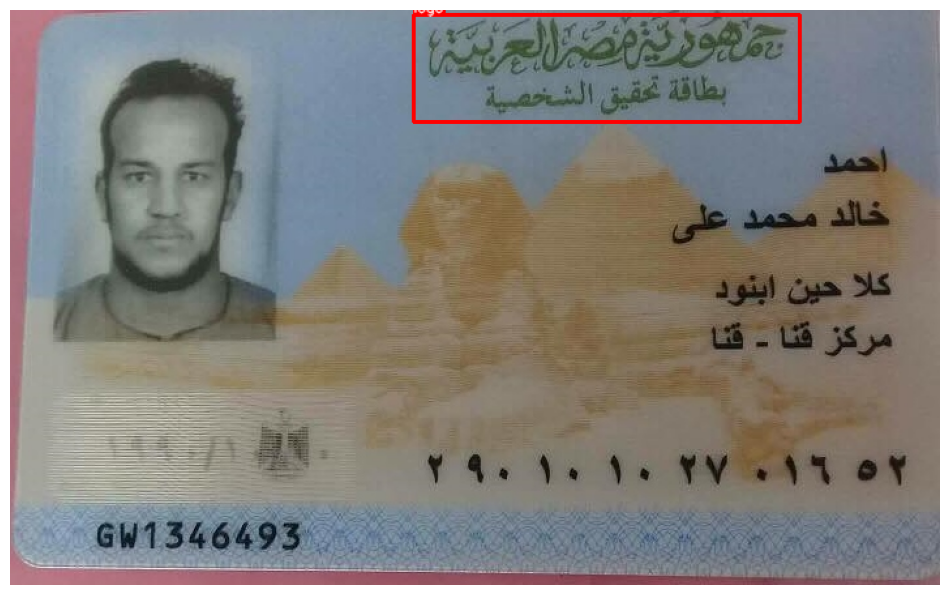

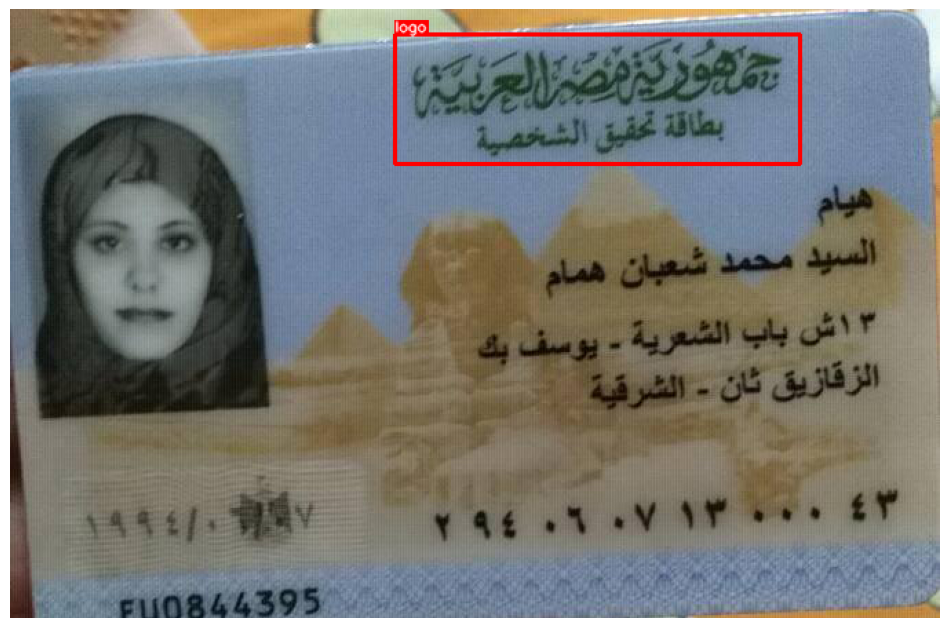

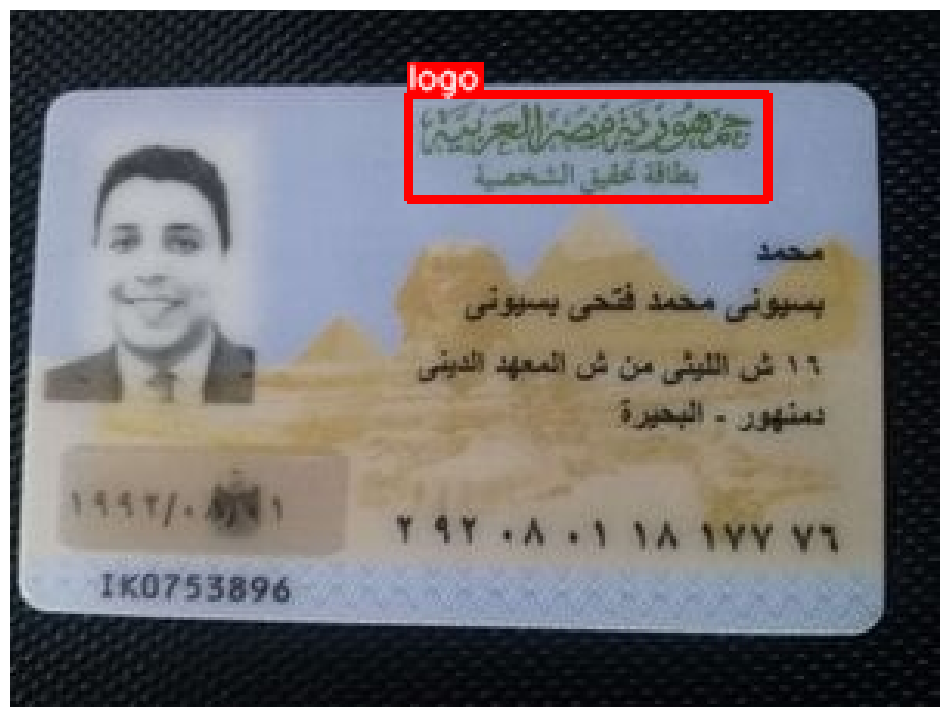

In [2]:
imgs_src = r"..\data\images"
lbls_src = r"..\data\labels" # images are annotated, text files for logo coordinates are generated for each image

names = [name.split(".")[0] for name in os.listdir(lbls_src)]
lbls_pths = [os.path.join(lbls_src, name+".txt") for name in names]
imgs_pths = [os.path.join(imgs_src, name+".jpg") for name in names]
data = list(zip(imgs_pths, lbls_pths))

for file in data:
    image, _, _, ratio = img_loader(file[0])
    yolo_anno, category_ids = load_yolo_annotations(file[1])
    visualize(image, yolo_anno, category_ids, category_id_to_name)

## Augmenting Images

In [3]:
org_data_src = r"..\data" # This path should contain two sub-dirs: images and labels

cat_augmenatation_count = {"logo":6} # number of augmentations for each image

apply_augmentation(org_data_src, cat_augmenatation_count) # will create two new directories for augmented images and their label files

## Visualize Some of Augmented Images

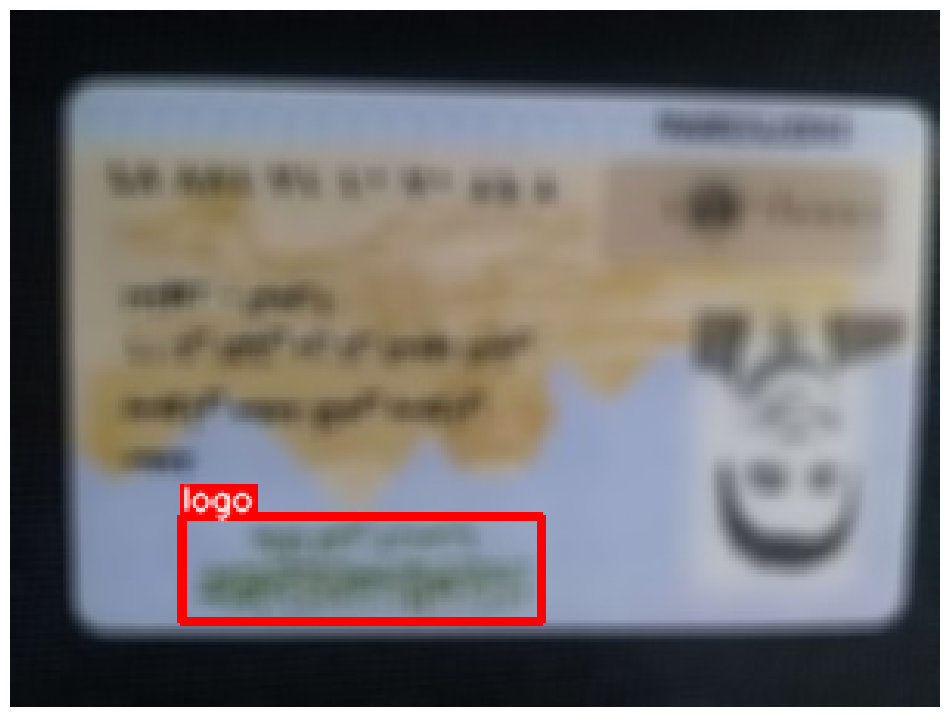

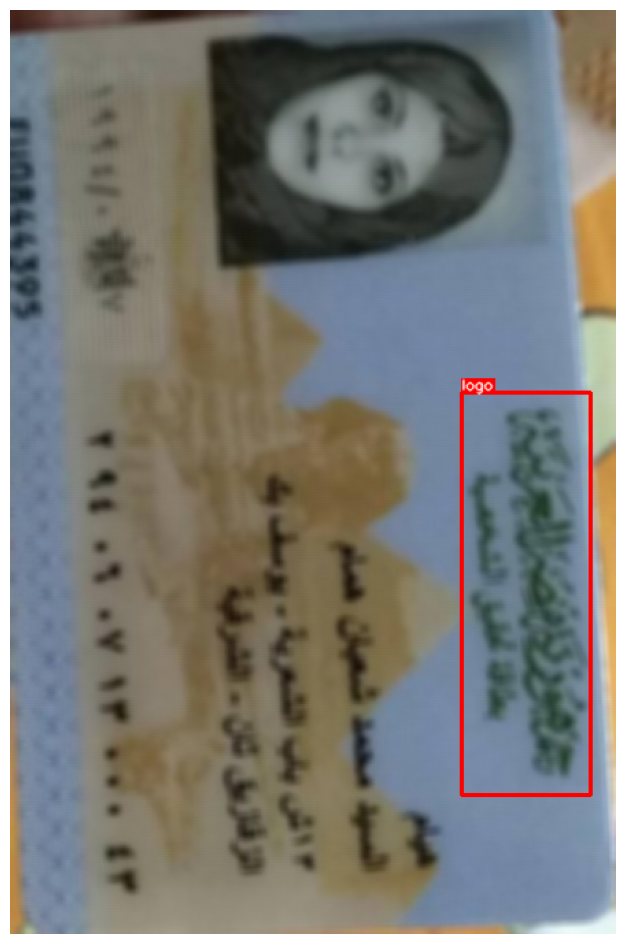

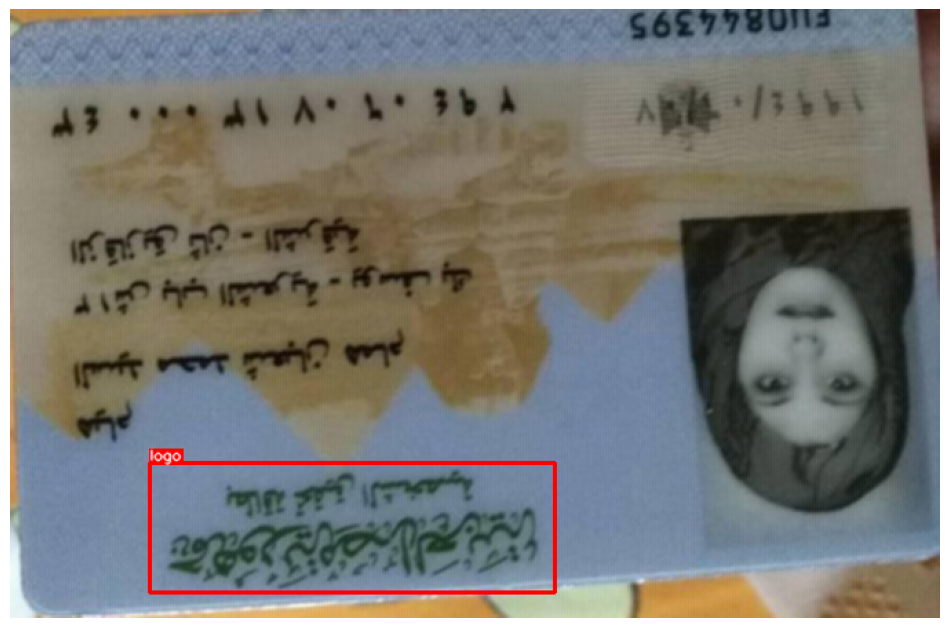

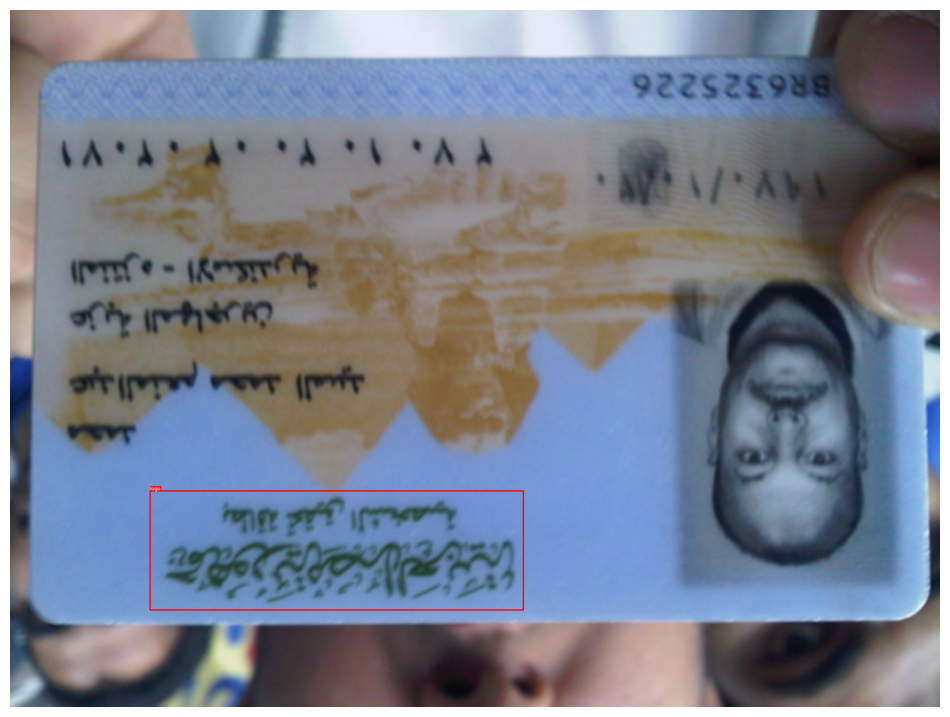

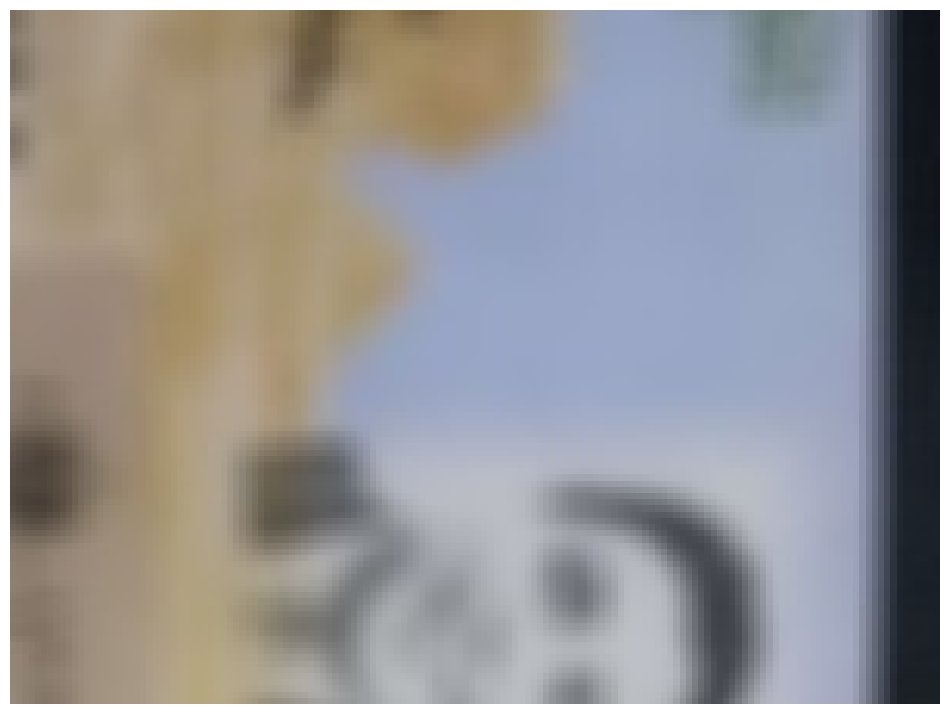

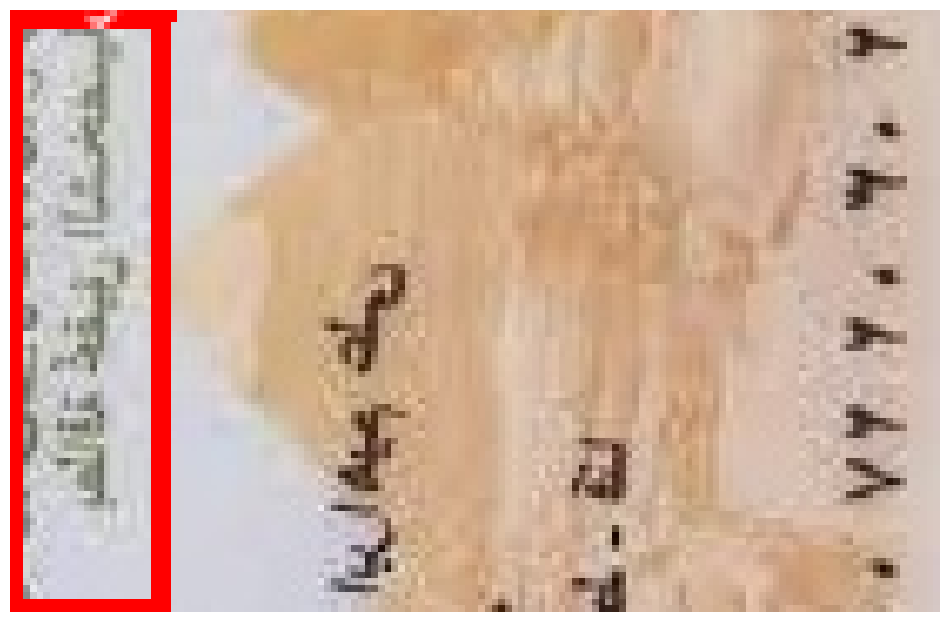

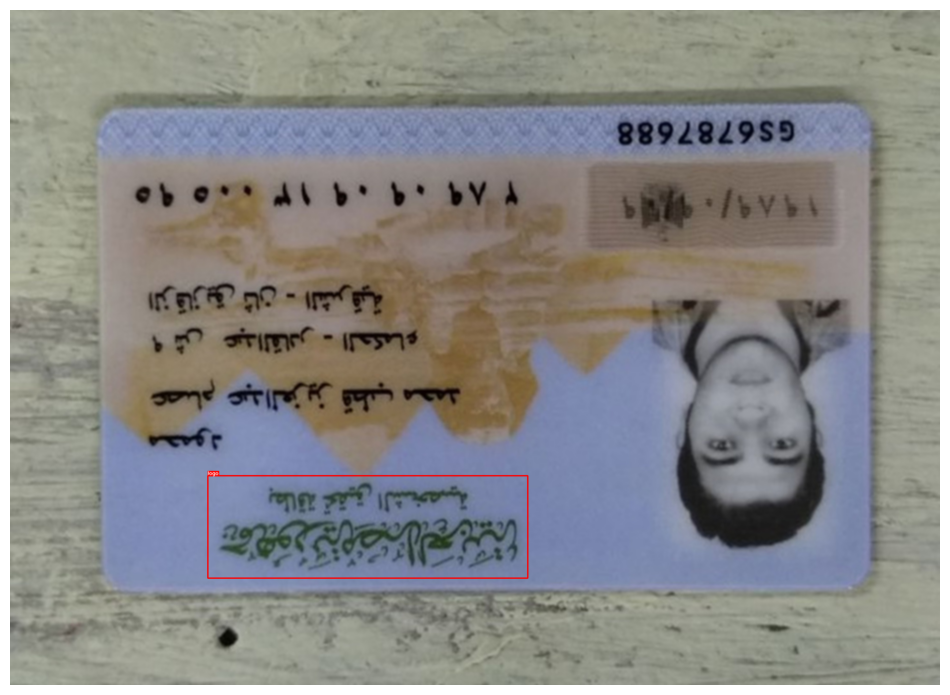

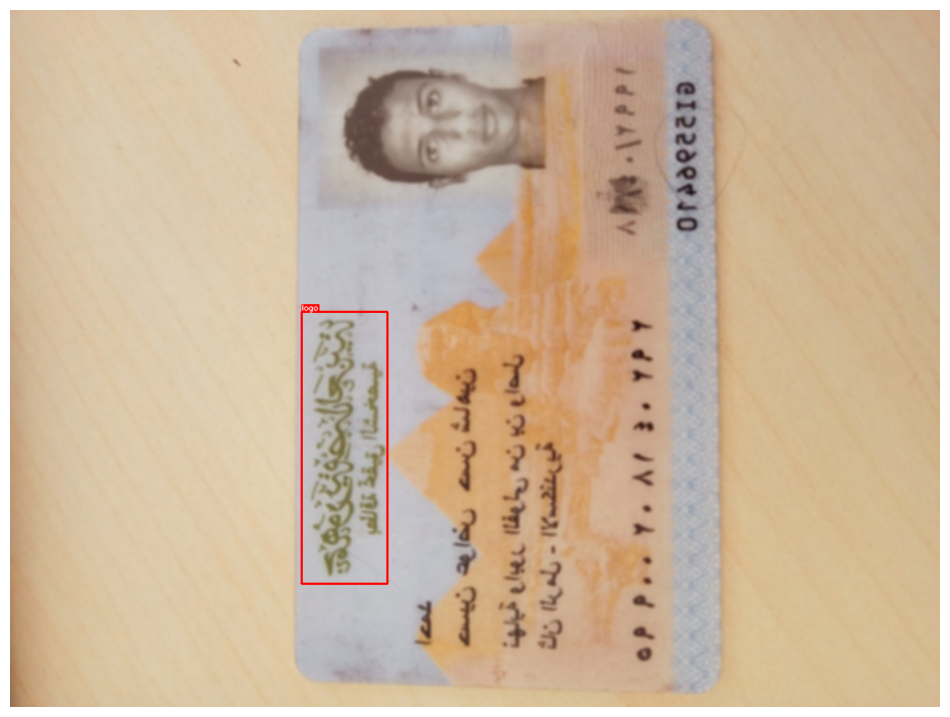

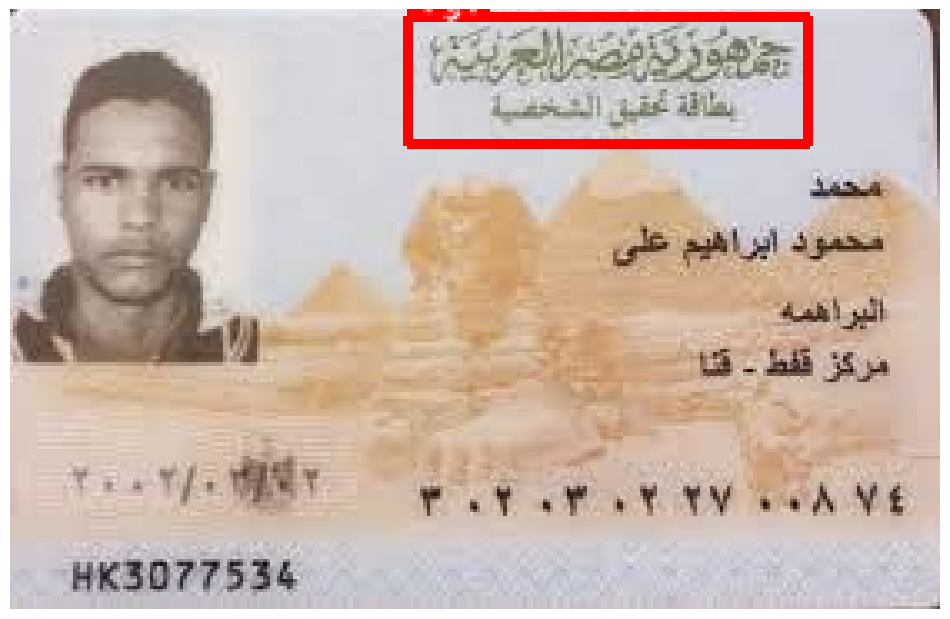

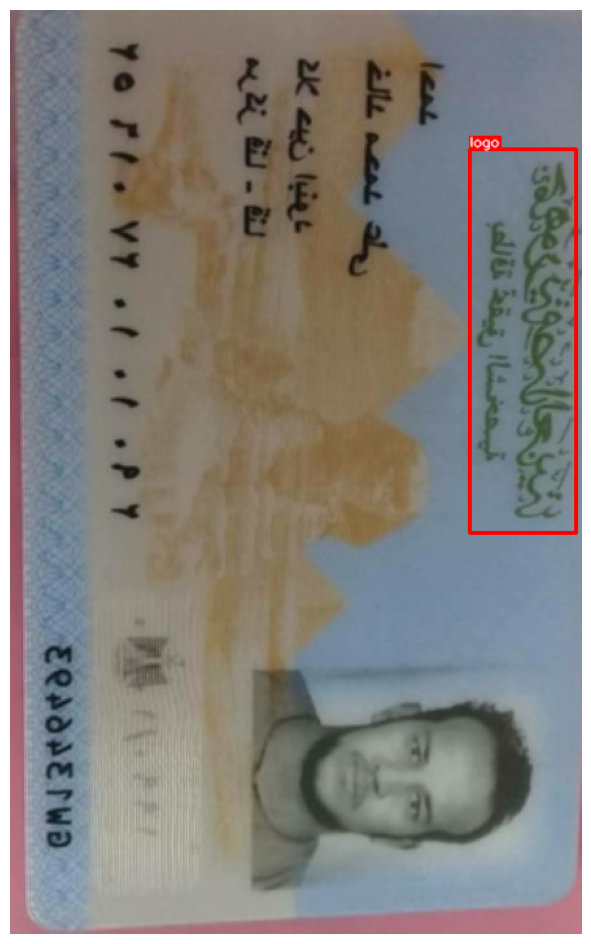

In [4]:
imgs_src = os.path.join(org_data_src, "aug images") # generated augmented images
lbls_src = os.path.join(org_data_src, "aug labels") # generated label files for augmented images

names = [name.split(".")[0] for name in os.listdir(lbls_src)]
lbls_pths = [os.path.join(lbls_src, name+".txt") for name in names]
imgs_pths = [os.path.join(imgs_src, name+".jpg") for name in names]
data = list(zip(imgs_pths, lbls_pths))
sample_data = random.sample(data, 10)

for file in sample_data:
    image, _, _, ratio = img_loader(file[0])
    yolo_anno, category_ids = load_yolo_annotations(file[1])
    visualize(image, yolo_anno, category_ids, category_id_to_name)

## Split Data for Training 

In [5]:
dataset_path = r"..\data\dataset"
imgs_dir = r"..\data\aug images" 
labels_dir = r"..\data\aug labels"
split_data(dataset_path, imgs_dir, labels_dir) # user defined function to split images into train 60%, validation 20%, and test 20%

total number of images is 54, training images 32, validation images 11, and test images 11


## Train YOLO Model 

In [6]:
from ultralytics import YOLO

In [7]:
!yolo detect train data=data.yaml model=yolov8n.pt epochs=100 imgsz=640 batch=10 # need to configure yaml file

## Detect Logo and Delete It

will run the model on the original images to test on them


0: 480x640 1 logo, 126.3ms
Speed: 30.6ms preprocess, 126.3ms inference, 1054.7ms postprocess per image at shape (1, 3, 480, 640)


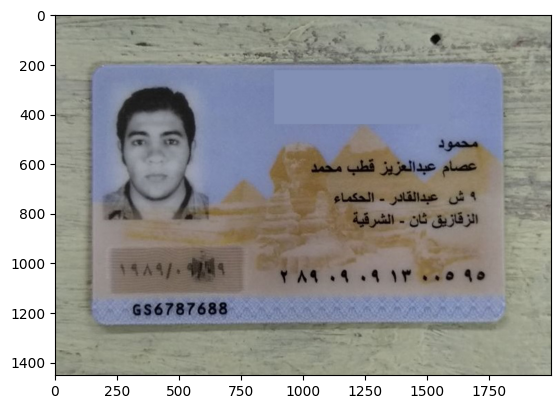


0: 640x480 1 logo, 83.7ms
Speed: 8.1ms preprocess, 83.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)


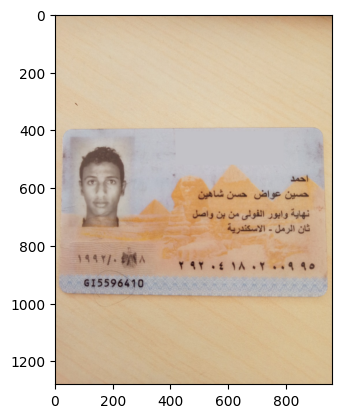


0: 416x640 1 logo, 62.1ms
Speed: 2.0ms preprocess, 62.1ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


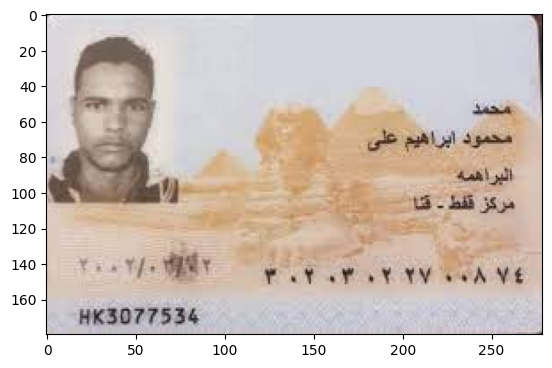


0: 480x640 1 logo, 83.2ms
Speed: 3.0ms preprocess, 83.2ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)


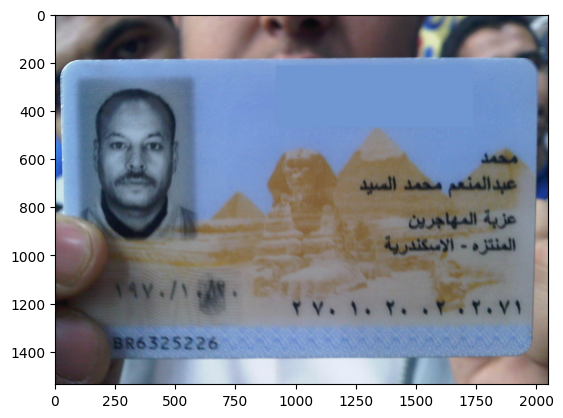


0: 352x640 1 logo, 79.0ms
Speed: 3.0ms preprocess, 79.0ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 640)


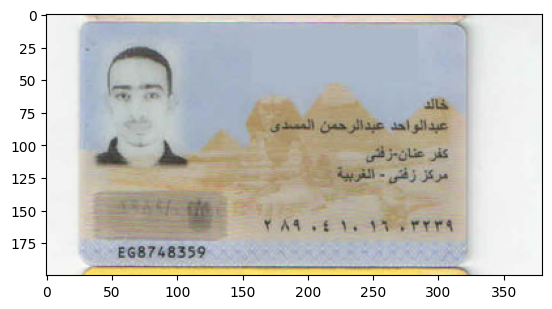


0: 640x480 1 logo, 91.3ms
Speed: 4.0ms preprocess, 91.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


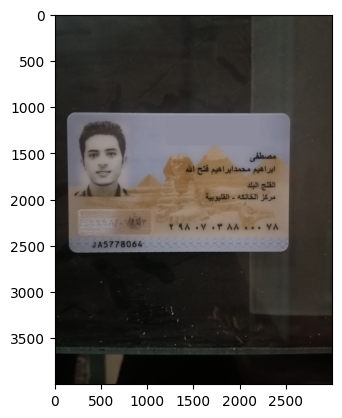


0: 416x640 1 logo, 67.7ms
Speed: 4.0ms preprocess, 67.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


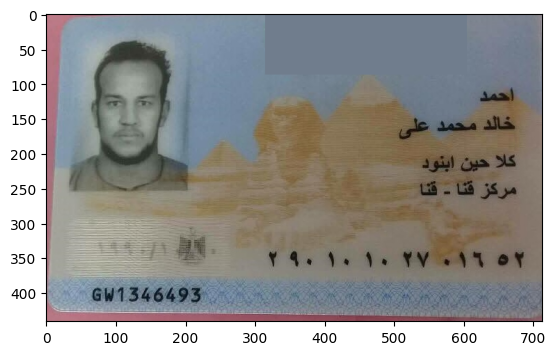


0: 448x640 1 logo, 79.2ms
Speed: 3.0ms preprocess, 79.2ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)


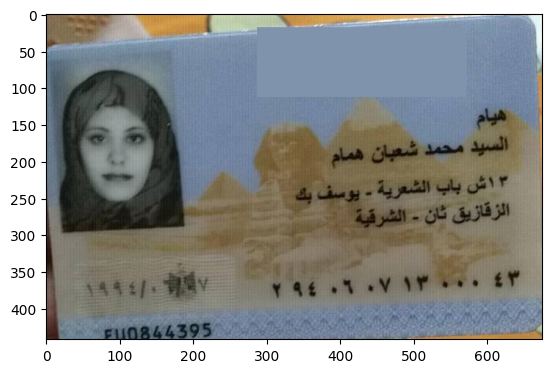


0: 480x640 1 logo, 90.1ms
Speed: 2.0ms preprocess, 90.1ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)


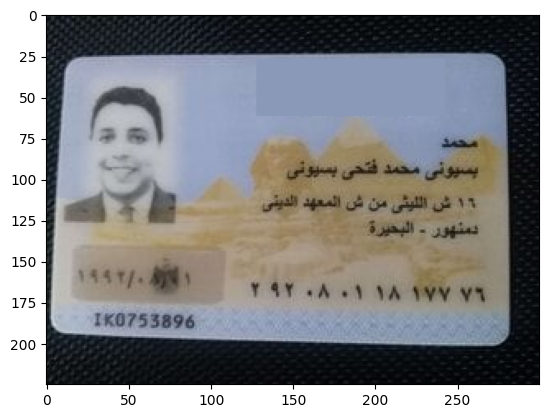

In [8]:
model_path = r"logo_detector.pt" 

imgs_src = r"..\data\images" # note: these images were not included in training set, only their augmentations
imgs_dest = r"..\data\images no logo"

names = os.listdir(imgs_src)

imgs_paths = [os.path.join(imgs_src, img) for img in names]
imgs_dests = [os.path.join(imgs_dest, img) for img in names]

imgs = list(zip(imgs_paths, imgs_dests))

for img_src, img_dest in imgs:
    img_no_logo = remove_logo(model_path, img_src, img_dest, conf=0.6);
    plt.figure()
    plt.imshow(img_no_logo)
    plt.show()

some better interpolation methods can be applied here instead of using only fixed color for better visually appealing results